# Restaurant Insights: Find the Best Dining in Your Area


## Summary
In this article, we are going to provide you with a set of tools, that will allow you to analyze restaurants in your neighbor and use that information to your advantage. Even though it may seem this is only for individuals who may be interested in popular dishes, but it also provides valuable information for businesses about their competition as well as insights into their own dining services.
Google Map reviews , however it may be sometimes difficult to acces all of this data.

To achieve this, we are going to utilize [ImageBind](https://github.com/facebookresearch/ImageBind), which is a very capable model as it can project many different kind of modalities into a common vector space. In case you would be interested in a brief introduction to this transformer-based model, you could also follow our previous blog post [Use ImageBind & Multimodal Retrieval for AI Image Search](https://www.activeloop.ai/resources/use-image-bind-multimodal-retrieval-for-ai-image-search/). Since our data will consist of reviews from Google Maps, we will focus only on textual and image modalities. This is especially powerful in combination with [DeepLake](https://www.activeloop.ai/), which is a multimodal vector database capable of efficient storage of both of these. In particular, we will use it for vector search, in which we will extract image and text reviews that are the most relevant for particular task.

Overall, this will allow you to extract information from publicly available reviews and utilize it for further decision making. Be it finding an unexplored place or understanding what tastes people around share.


## Steps
1. Selecting Location
2. Scraping the Restaurant Reviews
3. Ingesting the data into DeepLake Vector Store
4. Finding the Best Reviewed Restaurant with Your Favourite Food 
5. Categorizing Images to Restaurant Tags
6. Clustering All Images to Find the Most Popular Dishes
7. Summarizing the Findings

In [ ]:
# Install dependencies
# pip install openai langchain deeplake apify-client torch

# Import libraries
from apify_client import ApifyClient
import urllib.request
from langchain.vectorstores import DeepLake
from langchain.chains import RetrievalQA
from langchain.chat_models import ChatOpenAI
from langchain.llms import OpenAI
from langchain import PromptTemplate
from langchain.embeddings.base import Embeddings
import sys
sys.path.append("ImageBind")
from imagebind import data
from imagebind.models import imagebind_model
from imagebind.models.imagebind_model import ModalityType
import torch
import os
import re
from tqdm import tqdm
from collections import defaultdict
from PIL import Image
import pandas as pd
import numpy as np
import base64
from io import BytesIO
from IPython.display import HTML
from sklearn.cluster import KMeans


pd.set_option('display.max_colwidth', None)
os.environ['OPENAI_API_KEY'] = '<YOUR_OPENAI_TOKEN>'
os.environ['ACTIVELOOP_TOKEN'] = '<YOUR_ACTIVELOOP_TOKEN>'
os.environ['APIFY_API_TOKEN'] = '<YOUR_APIFY_API_TOKEN>'

### Step 1: Selecting Location
First of all, you need to find longitude and latitude of your location, from which the data will be scraped. This can be done in many ways, but the most straightforward is to open google maps, search for the place, right-click it and copy the coordinates. In our example, we will use following location: `Crepevine, 300 Castro Street, Mountain View, CA 94041, United States of America`, which gives us `Latitude=37.3926` and `Longitude=-122.0800`. In case you would need to automate this, feel free to use geocoding via [Google Maps API](https://github.com/googlemaps/google-maps-services-python).


### Step 2: Scraping the Restaurant Reviews
[Google Maps API](https://github.com/googlemaps/google-maps-services-python) offers many capabilitiesis including information about places from given location. They also have a generous free budget of `300$` every month, but it was a great dissapointment that it is only able to extract 5 reviews for each restaurant, which is far from being enough for our task. Therefore, we recommend to utilize [Apify](https://apify.com/) actor. We experimented with other scrapers too, but unless you are willing to pay extra for faster scraping, it should be sufficient. You can see the `run_inputs` for more details, but this is the summary of our setup:
- all restaurants in 2 KM radius
- reviews only from 1.1.2022
- no limit for max images/texts/restaurants

Apify provides a budget of `5$` per month and to give you an idea, here are the results of our run:
- total restaurants scraped: 130
- total scraping time: 75 minutes
- total costs: 2.3$

This should be fast enough to scrape restaurants in your city, however, expanding to more locations might be problematic.


In [ ]:
# Initialize the ApifyClient with your API token
client = ApifyClient(os.environ["APIFY_API_TOKEN"])

# Prepare the Actor input
run_input = {
  "customGeolocation": {
    "type": "Point",
    "coordinates": [
      "-122.0800081",
      "37.39252210000001"
    ],
    "radiusKm": 2
  },
  "deeperCityScrape": False,
  "includeWebResults": False,
  "language": "en",
  "maxCrawledPlacesPerSearch": 99999,
  "maxImages": 99999,
  "maxReviews": 99999,
  "oneReviewPerRow": False,
  "onlyDataFromSearchPage": False,
  "reviewsSort": "newest",
  "reviewsStartDate": "2022-01-01",
  "scrapeResponseFromOwnerText": False,
  "scrapeReviewId": False,
  "scrapeReviewUrl": False,
  "scrapeReviewerId": False,
  "scrapeReviewerName": False,
  "scrapeReviewerUrl": False,
  "searchStringsArray": [
    "restaurant"
  ]
}

# Run the Actor and wait for it to finish
run = client.actor("compass/crawler-google-places").call(run_input=run_input)

After we scrape the data, it is necessary to define a function to extract reviews and other parameters. Since the scraper only extracts the url link, it is useful to save the images during the first run and save them locally. This is useful because during our experiments we encountered problems when some of the images were no longer available and we needed to check each url separately prior to ingesting the data into DeepLake. Their format was different from other images which caused issues during ingestion. Nevertheless, it likely that there is a more efficient way to avoid it.


The image requesting is quite slow as well and in our experiments it took around 70 minutes to process the total of 7813 images.

In [288]:
def review_mapping_function(item, save_images=False):
    title = item["title"]
    text_dict = defaultdict(list)
    image_dict = defaultdict(list)
    tag_dict = defaultdict(list)
    image_folder = "images/" + title
    image_folder = image_folder.replace('|', '') 
    if (not os.path.exists(image_folder)) and save_images:
        os.makedirs(image_folder)
        
    for tag in item['reviewsTags']:
        tag_dict['metadata'] += [{'title': title}]
        tag_dict['tags'] += [tag['title']]
    for tag in ['interior', 'menu', 'drink']:
        tag_dict['metadata'] += [{'title': title}]
        tag_dict['tags'] += [tag]
    
    for idx, r in enumerate(item["reviews"]):
        text = r["textTranslated"]
        # if text was originally in english, textTranslated is None
        if text is None:
            text = r["text"]
        image = r["reviewImageUrls"]
        
        if text:
            metadata = {
                "title": title,
                "review_id": idx,
                "likes": r['likesCount'],
                "stars": r['stars'],
            }
            text_dict["text"].append(text)
            text_dict["metadata"].append(metadata)
            
        if image:
            j=0
            for image_url in image:
                image_path = f"{image_folder}/{j}.jpg"
                metadata = {
                    "title": title,
                    "review_id": idx,
                    "likes": r['likesCount'],
                    "stars": r['stars'],
                }
                image_dict["metadata"].append(metadata)
                # change image size
                image_url = re.sub('=w[0-9]+-h[0-9]+-', '=w512-h512-', image_url)
                if save_images:
                    urllib.request.urlretrieve(image_url, image_path)

                if os.path.isfile(image_path):
                    # image was saved, we can just load it with path
                    image_dict["image"].append(image_path)
                    j+=1
                else:
                    # image not saved, need to put url and request it later
                    image_dict["image"].append(image_url)

    return {'text_dict': text_dict, 'image_dict': image_dict, 'tag_dict': tag_dict}

In [289]:
reviews = [review_mapping_function(item) for item in scraped_data]

In [292]:
# extract reviews
reviews = [review_mapping_function(item) for item in client.dataset(run["defaultDatasetId"]).iterate_items()]

# aggregate them into a single dictionary
text_dict_concat = defaultdict(list)
image_dict_concat = defaultdict(list)
tag_dict_concat = defaultdict(list)

for r in reviews:
    for key in r['text_dict'].keys():
        text_dict_concat[key] += r['text_dict'][key]
    for key in r['image_dict'].keys():
        image_dict_concat[key] += r['image_dict'][key]
    for key in r['tag_dict'].keys():
        tag_dict_concat[key] += r['tag_dict'][key]

### 3) Ingesting the data into DeepLake Vector Store
Initially, we experimented with various setups of the vector database. Eventhough the DeepLake is capable of saving text and img tensors in the same database, it gets quite complex as one review can have none or a single textual message, while images can range from zero up to as many as the reviewers add.If we decide to put all of them in the same database, it might look convenient but we need to duplicate the textual messages. As we did not find a particular usecase that would benefit from this and it only resulted in more complicated similarity search, we created two separate databases. One storing images from reviews and the other textual reviews, each one has a different call to our custom embedding function.
Additionally to this, we also introduce a third vector db with tags from each restaurant, which will be particularly useful during categorization in step 6.

Also note that before ingesting the data, it is a common practice to split the text into documents. However, as Google map reviews are limited by 4096 characters (around 700 words), it is not necessary.

In [ ]:
# Create empty database for texts
reviews_path = 'hub://benkdominik/reviews-texts'
reviews_texts = DeepLake(
    dataset_path = reviews_path,
    # tensor_params = [
    #     {'name': 'text', 'htype': 'text'},
    #     {'name': 'embedding', 'htype': 'embedding'},
    #     {'name': 'metadata', 'htype': 'json'}
    # ],
)
# Create empty database for images
reviews_path = 'hub://benkdominik/reviews-images'
reviews_images = DeepLake(
    dataset_path = reviews_path,
    # tensor_params = [
    #     {'name': 'image', 'htype': 'image', 'sample_compression': 'png'},
    #     {'name': 'embedding', 'htype': 'embedding'},
    #     {'name': 'metadata', 'htype': 'json'}
    # ],
)
# Create empty database for tags
reviews_path = 'hub://benkdominik/restaurants-tags'
restaurants_tags = DeepLake(
    dataset_path = reviews_path,
    # tensor_params = [
    #     {'name': 'tag', 'htype': 'text'},
    #     {'name': 'embedding', 'htype': 'embedding'},
    #     {'name': 'metadata', 'htype': 'json'}
    # ],
)


Now, let's define the custom ImageBind embedding function, which is a wrapper around [ImageBind](https://github.com/facebookresearch/ImageBind). Since the model needs to explicitly set the modality of input, it has two call options: 1) for text embedding 2) for image embedding. It is quite important to setup CUDA and run the predictions on GPU, as the performance on CPU is quite slow. You could also find it on [Replicate](https://replicate.com/daanelson/imagebind) and write a custom wrapper for that, but the processing time is typically slower compared to local runs and only a limited amount of data can be processed each month. However, if you do not have GPU available, this might be a better option.

In [4]:
class ImageBindEmbeddings():
    def __init__(self):
        self.device = "cuda:0" if torch.cuda.is_available() else "cpu"
        # Instantiate model
        self.model = imagebind_model.imagebind_huge(pretrained=True)
        self.model.eval()
        self.model.to(self.device)

    def embed_texts(self, text_list):
        inputs = {
            ModalityType.TEXT: data.load_and_transform_text(text_list, self.device),
        }
        with torch.no_grad():
            embeddings = self.model(inputs)
        return embeddings[ModalityType.TEXT].cpu()
    
    def embed_images(self, image_links):
        inputs = {
            ModalityType.VISION: data.load_and_transform_vision_data(image_links, self.device),
        }
        with torch.no_grad():
            embeddings = self.model(inputs)
        return embeddings[ModalityType.VISION].cpu()

Here, we proceed to ingesting the scraped data into DeepLake. Note that it is important to set `ingestion_batch_size` appropriately for your GPU capacity, to avoid running out of memory during embedding prediction.

In [ ]:
# loading the model
embeddings = ImageBindEmbeddings()

In [ ]:
# texts
review_texts.vectorstore.add(
    text = text_dict_concat['text'],
    metadata = text_dict_concat['metadata'],
    embedding_function = embeddings.embed_texts,
    embedding_data = text_dict_concat['text'],
    ingestion_batch_size=1000,
)
# images
review_images.vectorstore.add(
    image = image_dict_concat['image'],
    metadata = image_dict_concat['metadata'],
    embedding_function = embeddings.embed_images,
    embedding_data = image_dict_concat['image'],
    ingestion_batch_size=100,
)
# tags
restaurants_tags.vectorstore.add(
    tag = tag_dict_concat['tags'],
    metadata = tag_dict_concat['metadata'],
    embedding_function = embeddings.embed_texts,
    embedding_data = tag_dict_concat['tags'],
)

In case of 9607 textual reviews this took around 30 minutes, in case of 7813 images this was around 1.5 hours and for tags it was under 5 minutes. This Was given mostly by the long inference time of the ImageBind model.

### 4) Finding the Best Reviewed Restaurant with Your Favourite Food
Finally, it's time to get some useful insights into our embedded dataset! We start by finding 200 most relevant texts and images for search input `burger`.

In [106]:
search = 'burger'

text_search_results = reviews_texts.vectorstore.search(
    embedding_data = [search],
    embedding_function = embeddings.embed_texts,
    k=200,
)
image_search_results = reviews_images.vectorstore.search(
    embedding_data = [search],
    embedding_function = embeddings.embed_texts,
    k=200,
)

In [107]:
# aggregating the results
results = defaultdict(lambda: defaultdict(list))

for md, img in zip(image_search_results['metadata'], image_search_results['image']):
    results[md['title']]['images'].append(img)
    results[md['title']]['image_likes'].append(md['likes'])
    results[md['title']]['image_stars'].append(md['stars'])
    results[md['title']]['image_review_ids'].append(md['review_id'])
    
for md, txt in zip(text_search_results['metadata'], text_search_results['text']):
    results[md['title']]['texts'].append(txt)
    results[md['title']]['text_likes'].append(md['likes'])
    results[md['title']]['text_stars'].append(md['stars'])
    results[md['title']]['text_review_ids'].append(md['review_id'])

Now let's summarize the text reviews. For this we will use a simple prompt template that extracts a summary of keywords from a list of reviews and also includes an example. Since the reviews are typically short messages, we can only concatenate each set together and do not need to chain the calls with tools that are offered by [LangChain](https://python.langchain.com/docs/get_started/introduction.html).

In [115]:
llm = OpenAI(model_name='gpt-3.5-turbo', temperature=0.5)

In [113]:
prompt_template = """You are provided with a list of {search} reviews. Summarize what customers write about it:

Example:
List of {search} reviews: 
Great spicy Burger !\nThe burger is solid and delicious. Just be aware that it's high in calories (1100 calories!).\nVery good food, I would recommend to the burger lovers out there.\nThe burgers here are pretty solid\nthey also have a rotating beer top which has some good variety\nFantastic food\nBest Burgers In Town!!!\nGreat food\nDELICIOUS! BISON BURGER IS THE BEST"
delicious, cheap, good atmosphere, quick service, many options in menu.

Keyword summary of the {search} reviews:
Spicy burger, Solid and delicious, Recommended for burger lovers, Good variety of beers, Fantastic food, Best burgers in town, Bison burger is delicious


List of {search} reviews: 
{reviews}

Keyword summary of the {search} reviews:
"""

To put it all together, we are going to loop through all of the 200 texts and 200 images which have the most similar embedding to `burger`, group them by restaurant `title` and define the following:
- `avg_txt_stars` - average stars on text messages for a given restaurant
- `n_texts` - number of text messages for a given restaurant
- `text_summary` - keyword summary based on all of the text messages for a given restaurant
- `avg_img_stars` - average stars on images for a given restaurant
- `n_images` - number of images for a given restaurant
- `img_in_text_perc` - percentage number of images selected along with their original text message (% of images connected with text by the `review_id`)
- `image_{i}` - image in top n most similary images

To make the table more clear, we subset only top 5 images (sorted by the similarity score) and top 5 restaurants (sorted by number of images)

In [130]:
df_1 = pd.DataFrame(columns=['title','info', 'text_summary'])
top_n = 5 # maximum number of images for each restaurant
n_restaurants = 5
const = 1

i = 0
for title, values in results.items():
    df_1.loc[i, 'title'] = title
    
    info = {}
    
    if len(values['texts']) > 0:
        weights = np.add(values['text_likes'], const)
        avg_txt_stars = round(np.average(values['text_stars'], weights=weights), 2)
        info['avg_txt_stars'] = avg_txt_stars
        n_texts = len(values['text_stars'])
        info['n_texts'] = n_texts
        
        # set the prompt template
        PROMPT = PromptTemplate(
            template=prompt_template, 
            input_variables=["reviews"], 
            partial_variables={"search": search},
        )
        reviews = "\n".join(values['texts'])
        review_summary = llm(PROMPT.format(reviews=reviews, search=search))
        df_1.loc[i, 'text_summary'] = review_summary
        
    if len(values['images']) > 0:
        weights = np.add(values['image_likes'], const)
        avg_img_stars = round(np.average(values['image_stars'], weights=weights), 2)
        info['avg_img_stars'] = avg_img_stars
        n_images = len(values['image_stars'])
        info['n_images'] = n_images
        df_1.loc[i, 'n_images'] = n_images
        
        images_in_text = sum([i in values['text_review_ids'] for i in values['image_review_ids']])
        img_in_text_perc = round(images_in_text / len(values['image_review_ids']) * 100, 2)
        info['img_in_text_perc'] = img_in_text_perc
        sorted_images = [x for _, x in sorted(zip(values['image_likes'], values['images']), reverse=True, key=lambda x: x[0])]
        for j, img in enumerate(sorted_images):
            if j < top_n:
                df_1.loc[i, f'image_{j+1}'] = Image.fromarray(img).convert('RGB')

    df_1.loc[i, 'info'] = str(info)

    i+=1

For better visualisation, we also define HTML formatters as inspired by [this notebook](https://www.kaggle.com/code/stassl/displaying-inline-images-in-pandas-dataframe) and render the HTML as generated by pandas.

In [24]:
def get_thumbnail(path):
    i = Image.open(path)
    i.thumbnail((150, 150), Image.LANCZOS)
    return i

def image_base64(im):
    if isinstance(im, str):
        im = get_thumbnail(im)
    with BytesIO() as buffer:
        im.save(buffer, 'jpeg')
        return base64.b64encode(buffer.getvalue()).decode()

def image_formatter(im):
    return f'<img src="data:image/jpeg;base64,{image_base64(im)}">'

def bullet_formatter(text):
    text = eval(text)
    l = '<div> <ul style="text-align: left;">'
    for key, value in text.items():
        l += f"\n <li>{key}: {value}</li>"
    l += "\n</ul></div>"
    return l

,title,info,text_summary,image_1,image_2,image_3,image_4,image_5
0,Eureka! Mountain View,avg_txt_stars: 4.55 n_texts: 17 avg_img_stars: 4.53 n_images: 53 img_in_text_perc: 3.77,"Spicy burger, Solid and delicious, Recommended for burger lovers, Good variety of beers, Fantastic food, Best burgers in town, Bison burger is delicious, Cowboy burger is awesome, Good bar, New beer to try, Good food and service, Burgers and beer, Amazing hamburgers, Slow service, Expensive burgers, Truffle fries okay, Amazing burgers, Best menu selection, Reasonable prices, Friendly staff.",,,,,
2,In-N-Out Burger,avg_txt_stars: 4.42 n_texts: 35 avg_img_stars: 4.49 n_images: 52 img_in_text_perc: 7.69,"Love the burgers, Good beef burger, Delicious burgers, Great burger, Cheap burger, Tasty burger, Best burgers, Delicious and great service, Animal style burgers, Freshly made burgers and fries, Juicy and delicious burgers, Best fast food burger, Good price, Fast and delicious, Fresh and tasty burgers, Crunchy and crispy fries, Best burgers in California, Fast and indulgent burger, Fresh and tasty, Long wait time, Kids love the hamburgers.",,,,,
1,Chicken G's,avg_txt_stars: 4.86 n_texts: 6 avg_img_stars: 4.86 n_images: 36 img_in_text_perc: 0.0,"Massive burger, Tasted good, Worth a try, Amazing food, Go-to for chicken sandwich, Domestic spicy chicken burger, Good chicken, Awesome and delicious halal burgers",,,,,
4,Roger Bar and Restaurant,avg_txt_stars: 3.0 n_texts: 2 avg_img_stars: 4.78 n_images: 11 img_in_text_perc: 18.18,"Best hamburger in a while, Limited menu before 5 pm, Pricey average food",,,,,
6,Steins Beer Garden & Restaurant,avg_txt_stars: 4.4 n_texts: 5 avg_img_stars: 4.83 n_images: 11 img_in_text_perc: 0.0,"Good vibes, Great food, Consistently great burger, Great beer and burgers",,,,,

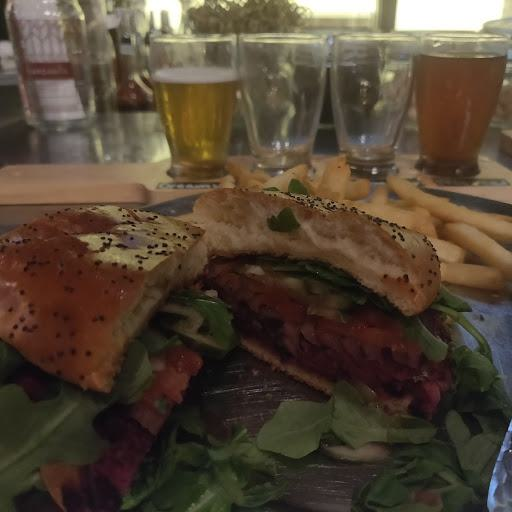
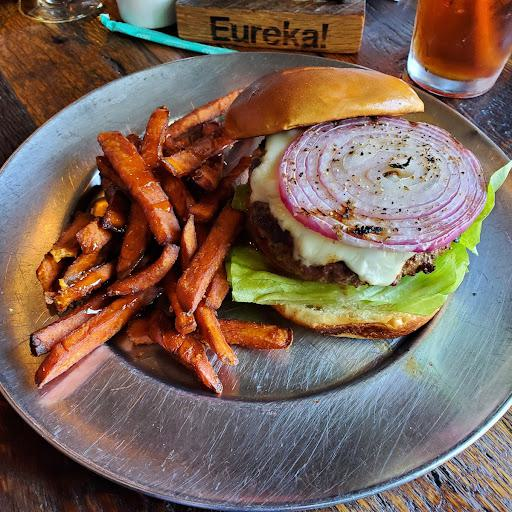
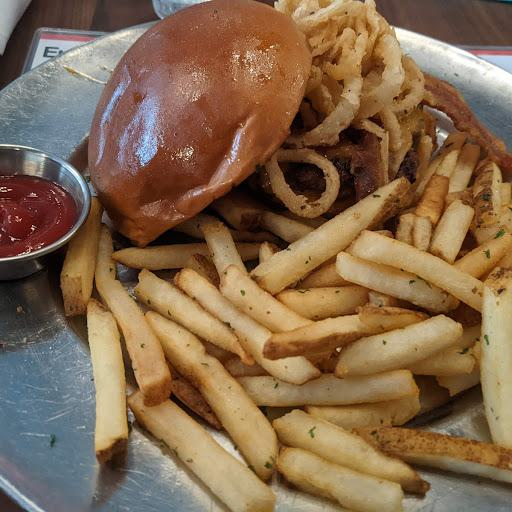
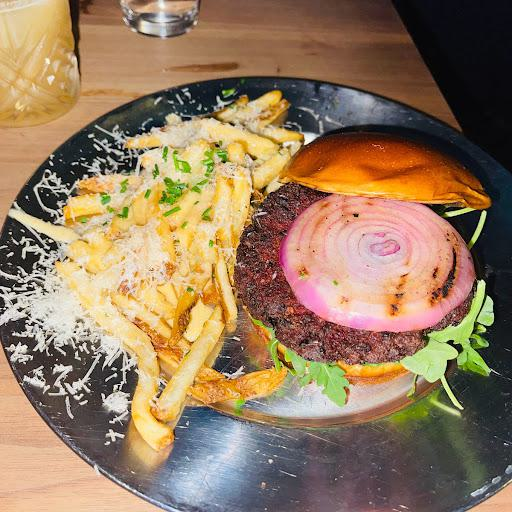
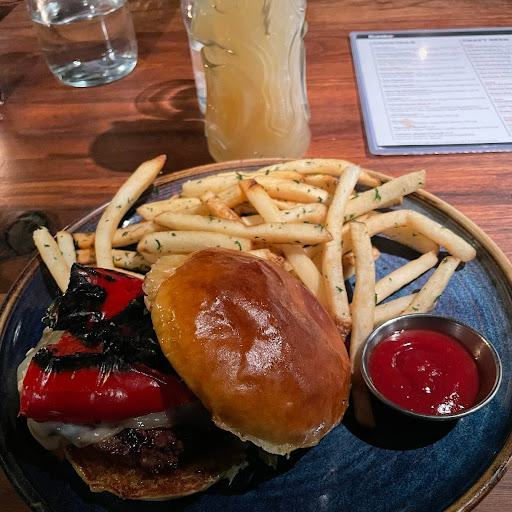
...
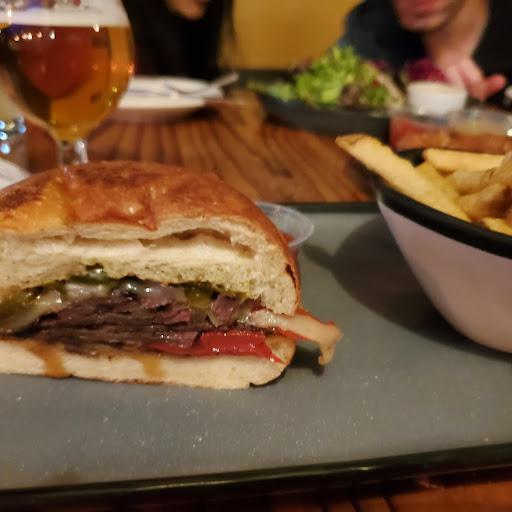
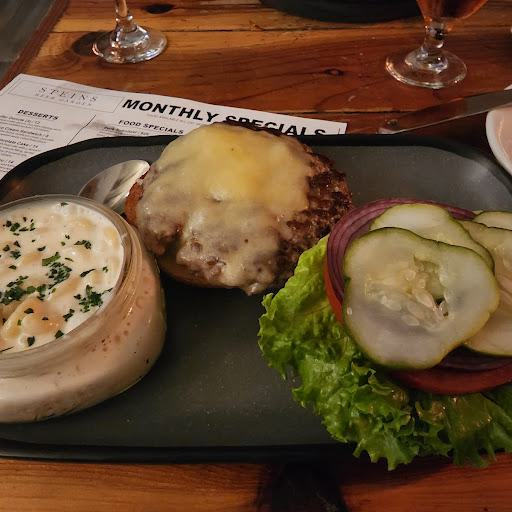
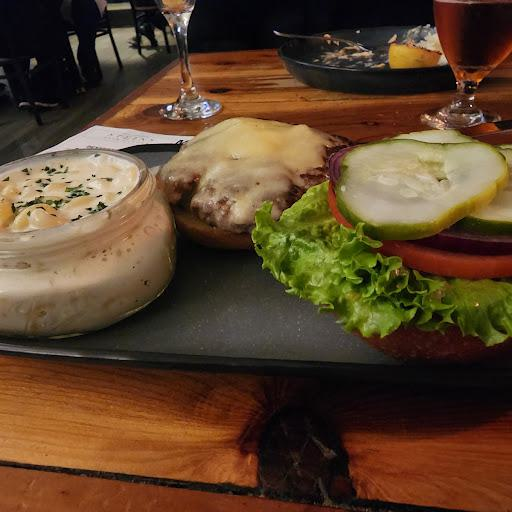
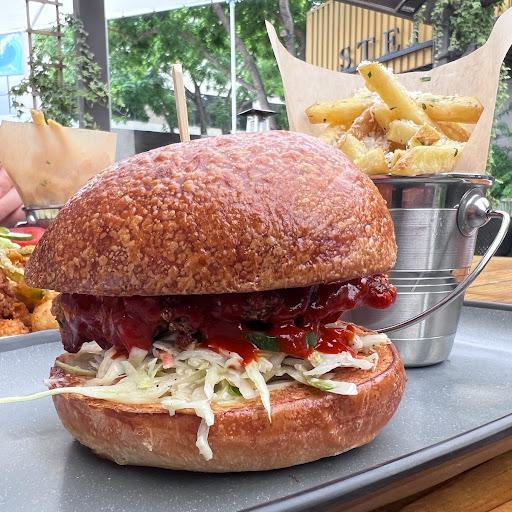
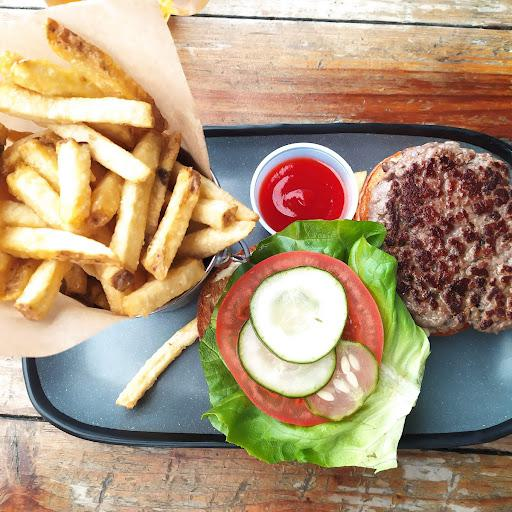

In [275]:
# sort by n_images
df_1 = df_1.sort_values(by=['n_images'], ascending=False).drop(['n_images'],axis=1)
# render HTML
formatters = [None, bullet_formatter, None] + [image_formatter] * top_n
HTML(df_1[:n_restaurants].to_html(formatters=formatters, escape=False, col_space=[150]*df_1.shape[1]))

The image results as you can see are very accurate, especially when you sort by vector similarity score. Summarizing textual reviews may seem to be sufficient too, but theres plenty room for prompt engineering. Also note that `img_in_text_perc` is very low and it was more of an experiment rather than proof that the results make sense. In other words, it is difficult to filter the images and text from the same review based on one embedding (in our example from `burger`).

### 5) Question Answering Based on Reviews
Of course there are many usecases for [LangChain](https://python.langchain.com/docs/get_started/introduction.html) as well. In particular, you could utilize the text reviews as a custom documents to answer any question. Note that as we embedded the tensors by ImageBind, we also need to set this function in the `restriever`. Also, as answering questions from the whole data does not make much sense in this case, we selected a single restaurant via the `filter` option in `search_kwargs`.

In [6]:
retriever = reviews_texts.as_retriever(
    search_type = "similarity",
    search_kwargs = {
        "k": 20,
        "embedding_function": embeddings.embed_texts,
        "filter": {'metadata': {'title': 'Eureka! Mountain View'}}
    }
)

To see what reviews based on similarity search is the LLM model provided with to answer your question, we can inspect the `relevant_documents` as seen in the 5 examples below.

In [13]:
query = 'What customers like about the restaurant?'
relevant_docs = retriever.get_relevant_documents([query])
relevant_docs[0:5]

100%|██████████| 9607/9607 [00:01<00:00, 5675.28it/s]


[Document(page_content='Good food and service.', metadata={'title': 'Eureka! Mountain View', 'review_id': 186, 'likes': 0, 'stars': 5}),
 Document(page_content='Delicious food with great lively atmosphere and yummy drinks!', metadata={'title': 'Eureka! Mountain View', 'review_id': 225, 'likes': 0, 'stars': 5}),
 Document(page_content='the food and service here is super good', metadata={'title': 'Eureka! Mountain View', 'review_id': 440, 'likes': 0, 'stars': 5}),
 Document(page_content='We had a Dinner with our customer.  nice Staff and a really cool place to eat', metadata={'title': 'Eureka! Mountain View', 'review_id': 339, 'likes': 0, 'stars': 5}),
 Document(page_content='Great food as always, service leaves some room for improvement though.', metadata={'title': 'Eureka! Mountain View', 'review_id': 167, 'likes': 0, 'stars': 4})]

Now, let's define the QA retrieval and run your questions. But again, we stress the importance of further improvements of the prompt templates as they have significant effect on the results.

In [17]:
qa = RetrievalQA.from_llm(llm, retriever=retriever)
qa.run([query])

100%|██████████| 9607/9607 [00:01<00:00, 5609.68it/s]


'Customers like the good food, delicious food, great atmosphere, yummy drinks, nice staff, cool place to eat, great ambience, solid selection of dishes and drinks, excellent service, friendly staff, delicious and well-made food, highly recommended, friendly and helpful staff, good for burger lovers, friendly service, amazing food, quick service, affordable prices, comfortable and friendly environment, awesome menu selection, great atmosphere, great service, awesome staff, cool bar scene, lively place, nice ambiance, and the ability to eat outside.'

In [19]:
query = 'What would customers improve about this restaurant?'
qa.run([query])

100%|██████████| 9607/9607 [00:01<00:00, 5343.85it/s]


'Service leaves some room for improvement.\nService staff can be a bit slow.\nAttitude from a waitress with glasses.'

### 5) Categorizing Images to Restaurant Tags
Typically, if your task is to categorize images, you need to train a model on labelled set, which then limits the capabilities as it can predict only classes included in the training data.
Here, however, we try to achieve similar results without training or finetuning any categorization model at all. Of course the model isn't perfect, but the results seem to be pretty cool considering that we did not perform any finetuning on restaurant data and it is just the original ImageBind.

Again, we filter only a single restaurant to make the predictions more clear.

In [77]:
tensors = reviews_images.vectorstore.search(
    return_tensors = ['image','embedding'],
    filter = {'metadata': {'title':'Eureka! Mountain View'}},
)

100%|██████████| 7813/7813 [00:06<00:00, 1167.39it/s]


Finally, we are going to utilize the third vector db which stores the restaurant tags along with their embeddings. The categorization is pretty straightforward as we are searching for the closest `tag` embedding for each of our images from the selected restaurant. After that we sort them by similarity scores and display top 10 images for each category.

Notice that for practical reasons we also included additional tags `interior`, `menu` and `drink` for each restaurant as these were quite frequent images not included in the tags.

In [ ]:
df_2 = pd.DataFrame()
i_dict = defaultdict(lambda: 1)
n_images = 200
max_cols = 10
categories = []
scores = []

for embedding in tensors['embedding']:
    closest = restaurants_tags.vectorstore.search(
        embedding = embedding,
        k = 1,
        filter = {'metadata': {'title':'Eureka! Mountain View'}},
    )
    categories += [closest['tag'][0]]
    scores += [closest['score'][0]]
    
sorted_images = [x for _, x in sorted(zip(scores, tensors['image']), reverse=True)]
sorted_categories = [x for _, x in sorted(zip(scores, categories), reverse=True)]

n = 0
for category, img in zip(sorted_categories, sorted_images):
    if n < n_images:
        i = i_dict[category]
        df_2.loc[category, f'image_{i}'] = Image.fromarray(img).convert('RGB')
        i_dict[category]+=1
        n+=1

Again, render the formatted HTML.

,image_1,image_2,image_3,image_4,image_5,image_6,image_7,image_8,image_9,image_10
truffle fries,,,,,,,,,,
deep fried mac and cheese,,,,,,,,,,
brussel sprouts,,,,,,,,,,
bone marrow burger,,,,,,,,,,
drink,,,,,,,,,,
menu,,,,,,,,,,
cheese balls,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bourbon,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
happy hour,,,,,,,,,,
interior,,,,,,,,,,

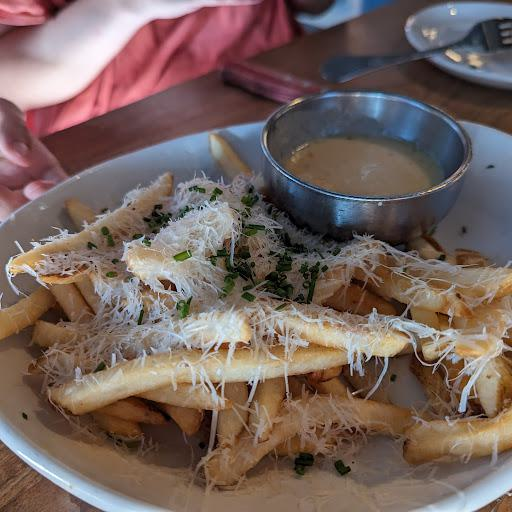
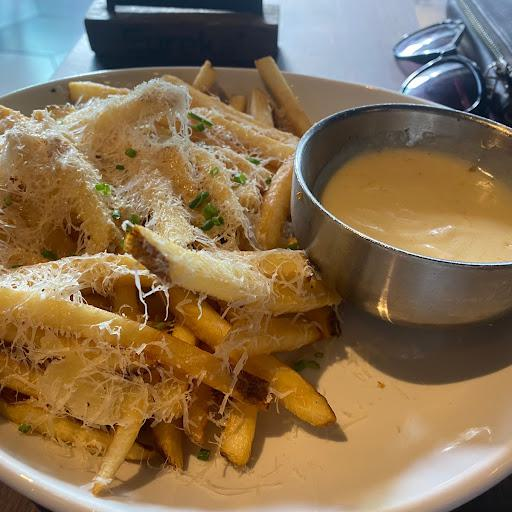
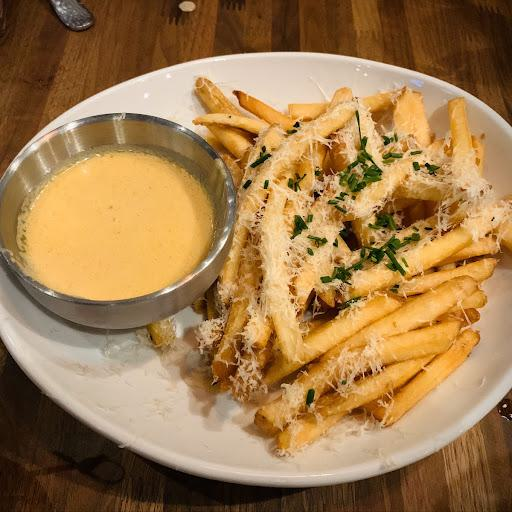
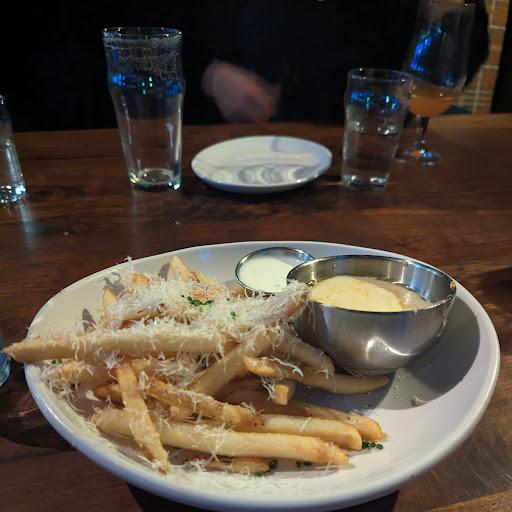
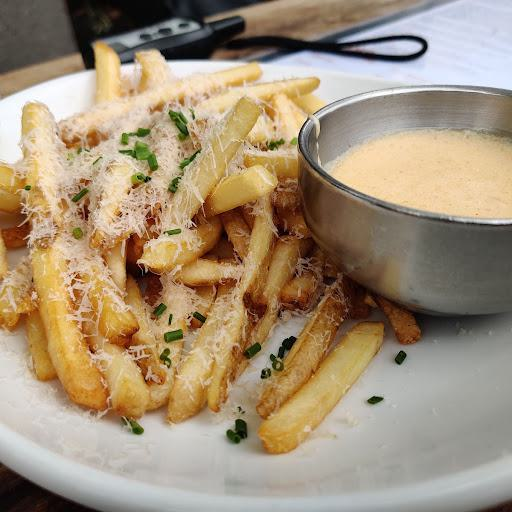
...
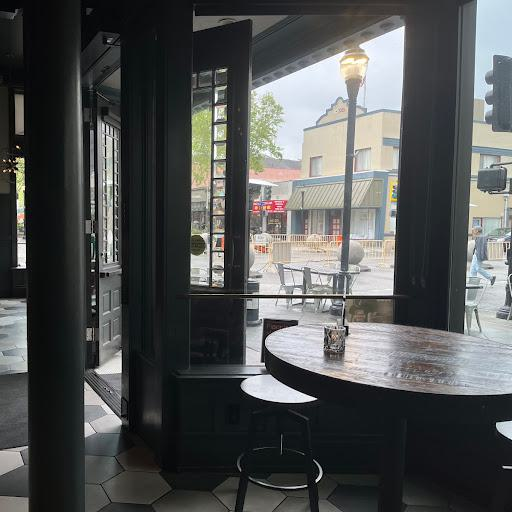
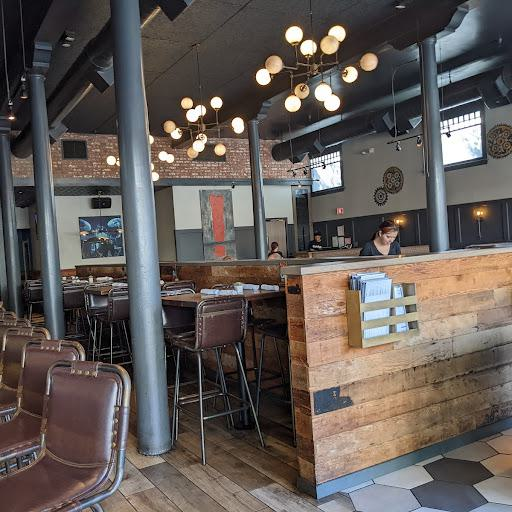
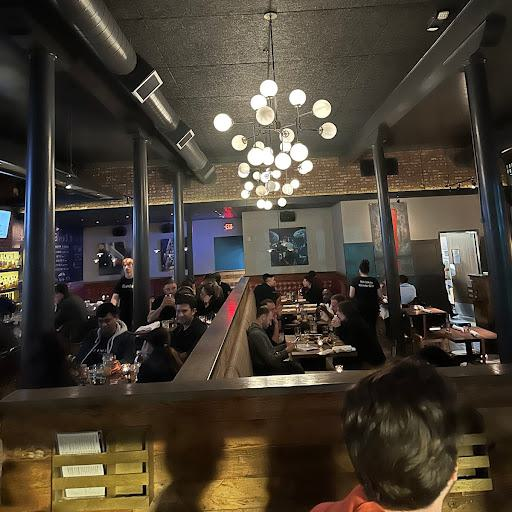
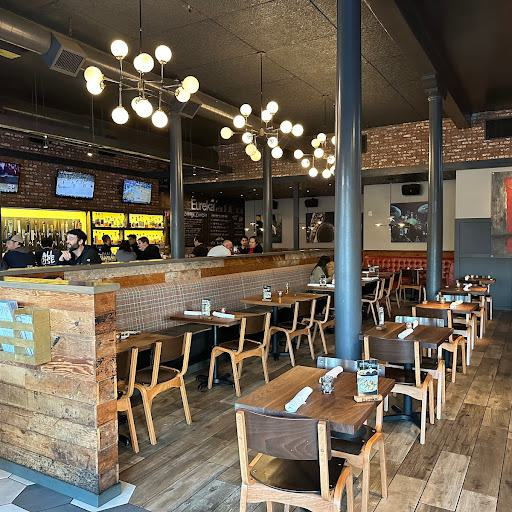
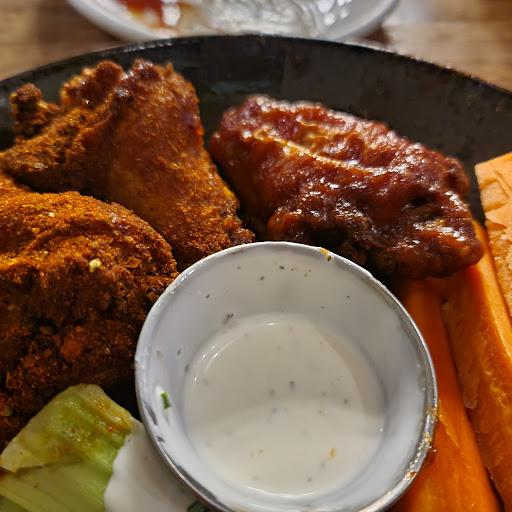

In [80]:
formatters = [image_formatter] * min(max_cols, df_2.shape[1])
HTML(df_2.iloc[:,:max_cols].to_html(formatters=formatters, escape=False))

### 6) Clustering All Images to Find the Most Popular Dishes

What if we want to group all of the images based on their similarity without any particular label to find the most popular meals? Of course you we can do that too! At the time of writing this article, DeepLake unfortunately does not support computing the cluster groups and extracting them. Anyways, it is on our road map and meanwhile you can visualise them in the DeepLake UI that computes them on the fly or follow this guide that extracts the embeddings from vector db and calculates the clusters locally.

We start by taking out 5000 images which embedding is simmilar to `food`. This process is quite time consuming since we are also extracting the images with metadata information.

In [ ]:
tensors = reviews_images.vectorstore.search(
    return_tensors = ['metadata','image','embedding'],
    embedding_data = ['food'],
    embedding_function = embeddings.embed_texts,
    k = 5000,
)

Then simply run the K-means clustering algorithm from sklearn. The number of cluster here is arbitrary as clustering is an unsupervised algorithm so you can play with other parameters too.

In [ ]:
n_clusters = 200
kmeans_model = KMeans(n_clusters = n_clusters)
clusters = kmeans_model.fit_predict(tensors['embedding']).tolist()

We then create a simple dataframe that aggregates information about clusters, stars and likes for each image and then select the top 10 images (sorted by similarity) from top 5 clusters (sorted by average number of likes).

In [76]:
agg = pd.DataFrame()
df_3 = pd.DataFrame(columns=['cluster', 'avg_likes', 'n_images'])
max_cols = 10
max_rows = 5

n = 0
for cluster, img, md in zip(clusters, tensors['image'], tensors['metadata']):
    agg.loc[n, 'cluster'] = cluster
    agg.loc[n, 'stars'] = md['stars']
    agg.loc[n, 'likes'] = md['likes']
    agg.loc[n, 'image'] = Image.fromarray(img).convert('RGB')
    n += 1
    
agg = agg.sort_values(by=['likes'], ascending=False)
agg = agg.groupby('cluster').agg({'likes':['mean','count'], 'image': list})
agg = agg.sort_values(by=[('likes', 'mean')], ascending=False)

r = 1
for index, row in agg.iterrows():
    if r <= max_rows:
        df_3.loc[r, 'cluster'] = int(index)
        df_3.loc[r, 'avg_likes'] = round(row['likes']['mean'], 2)
        df_3.loc[r, 'n_images'] = row['likes']['count']
        c=1
        for img in row['image']['list']:
            if c <= max_cols:
                df_3.loc[r, f'image_{c}'] = img
                c+=1
        r+=1

And render it

,cluster,avg_likes,n_images,image_1,image_2,image_3,image_4,image_5,image_6,image_7,image_8,image_9,image_10
1,162,3.83,12,,,,,,,,,,
2,0,3.67,6,,,,,,,NaN,NaN,NaN,NaN
3,124,2.87,46,,,,,,,,,,
4,167,2.5,10,,,,,,,,,,
5,50,2.41,22,,,,,,,,,,

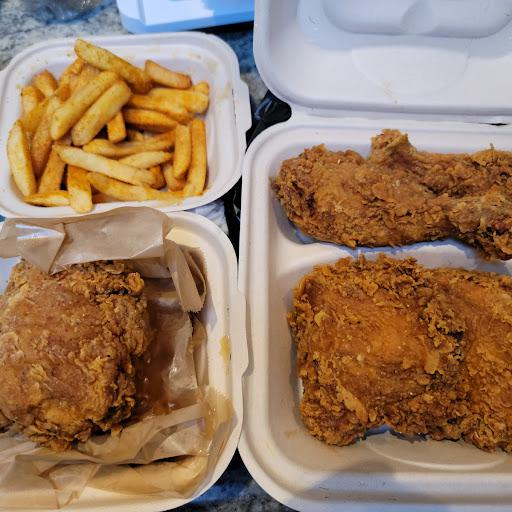
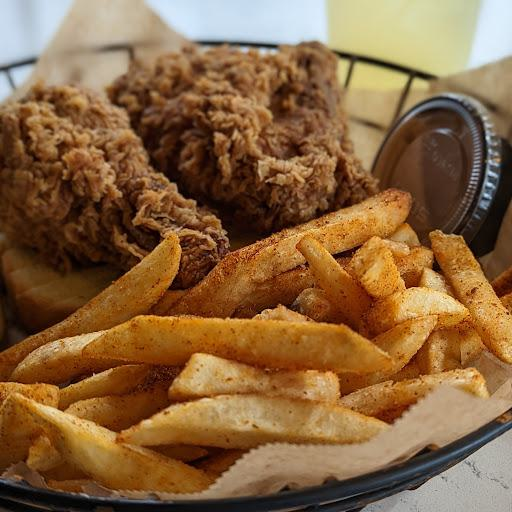
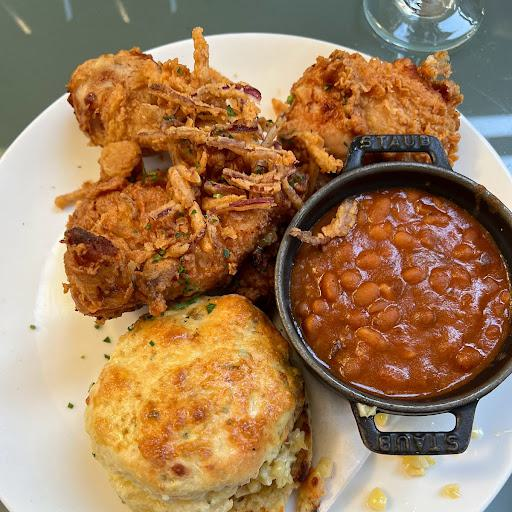
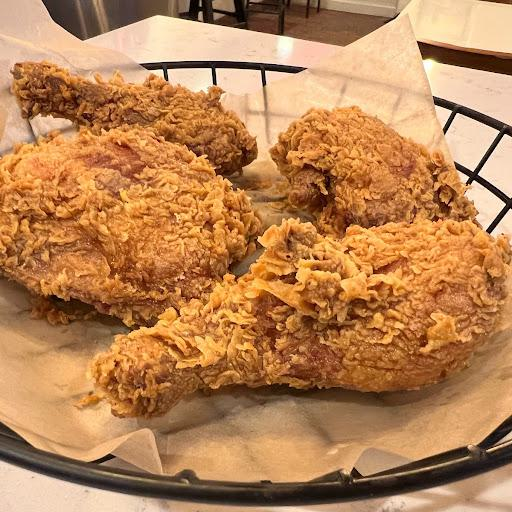
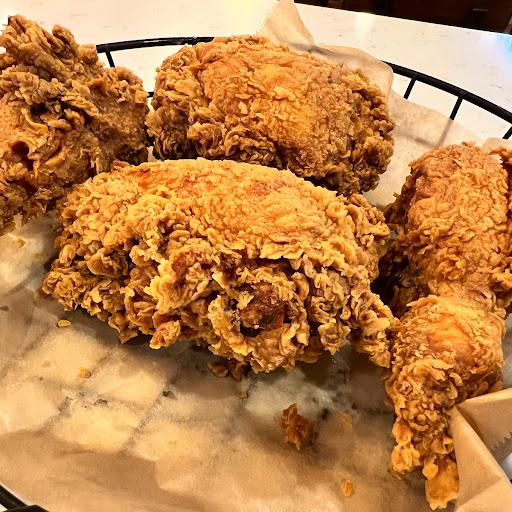
...
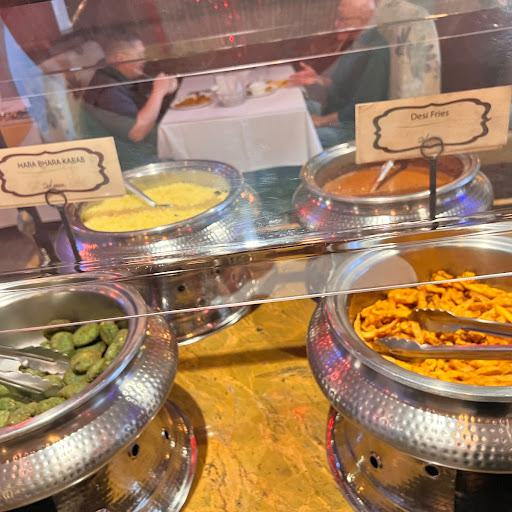
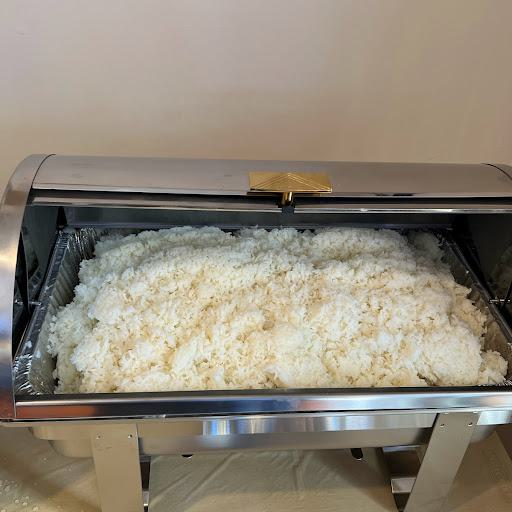
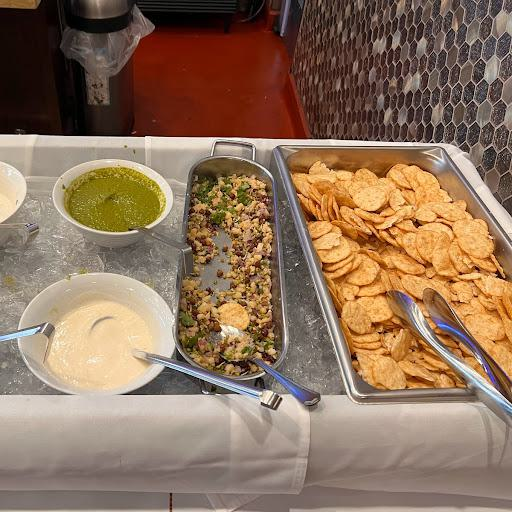
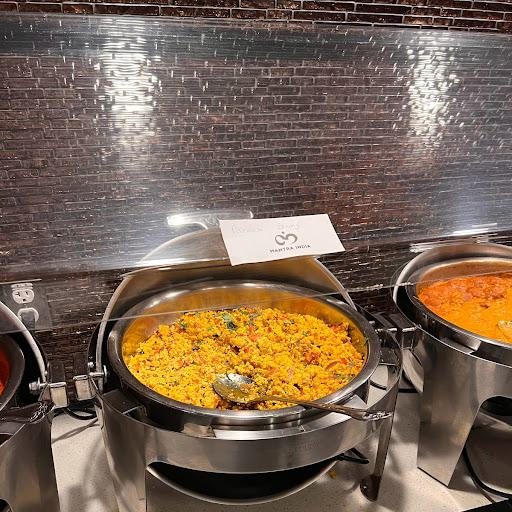
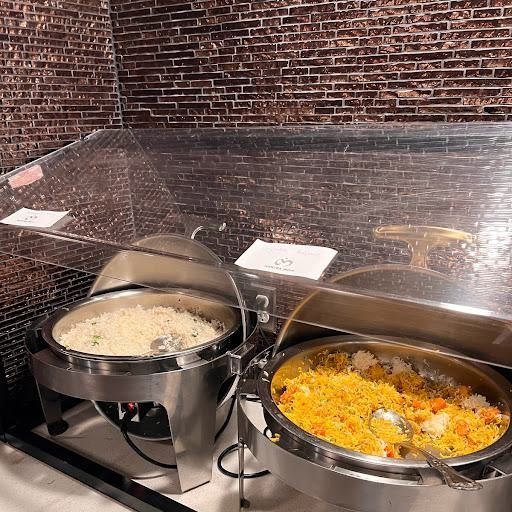

In [72]:
formatters = [None, None, None] + [image_formatter] * max_cols
HTML(df_3.to_html(formatters=formatters, escape=False))

As you can see, the food in each cluster is indeed quite similar. However, average likes might not be the appropriate metric to sort the most popular food as number of likes on each image is typicaly low. If cluster consists of many images, it is then more likely that we will not see it on top of this list.

# Summarizing the Findings
To conclude what is and is not possible in context of restaurant insights, the ImageBind embeddings are surprisingly accurate not just recognizing food in general, but also the particular dish. In combination with DeepLake, it then provides valuable insights into the restaurant reviews and can help you better imagine what people enjoy eating in your neighbour. This can be especially helpful if the dining options are rich. The biggest weakness, however, is the data preparation process which is highly time consuming. To scrape, process and ingest data from 130 restaurant, the total runtime was around 4.5 hours, nevertheless there are still ways to make this more efficient.

Overall, we see that the ImageBind embeddings are very powerful and can be very useful for LangChain as well, even though there is currently no integration. The highest potential we see in the unsupervised categorization and image search by text without any context, which as you could see worked pretty well and is far from being limited only to restaurant data.

We hope that you find this article interesting and useful for your future projects and hopefully see you next time.
Have a good day!